# Descriptive statistics of the dataset

## Repartition of the modalities of variables

In [2]:
import os
import pandas as pd

if os.path.exists("completed_dataset_sample.csv"):
    car_accidents_data = pd.read_csv("completed_dataset_sample.csv") # usecols=usecols) to select specific columns
else:
    print("completed_dataset_sample.csv file not found.")

In [3]:
car_accidents_data.head()

print(car_accidents_data["Driver Substance Abuse"].value_counts())

Driver Substance Abuse
NONE DETECTED                                          3841
Not Suspect of Alcohol Use, Not Suspect of Drug Use     904
UNKNOWN                                                 382
ALCOHOL PRESENT                                         121
Unknown, Unknown                                        107
ALCOHOL CONTRIBUTED                                      43
Suspect of Alcohol Use, Not Suspect of Drug Use          25
ILLEGAL DRUG PRESENT                                      9
ILLEGAL DRUG CONTRIBUTED                                  7
OTHER                                                     4
Suspect of Alcohol Use, Unknown                           3
MEDICATION CONTRIBUTED                                    3
Suspect of Alcohol Use, Suspect of Drug Use               3
COMBINED SUBSTANCE PRESENT                                2
Unknown, Not Suspect of Drug Use                          2
MEDICATION PRESENT                                        2
Not Suspect of Al

## Correlation between night and the percentage of accident with Driver Substance Abuse

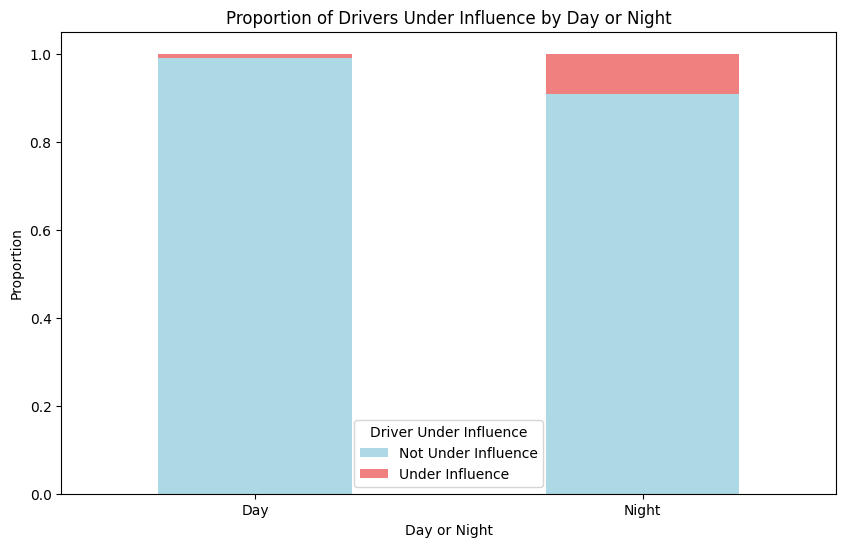

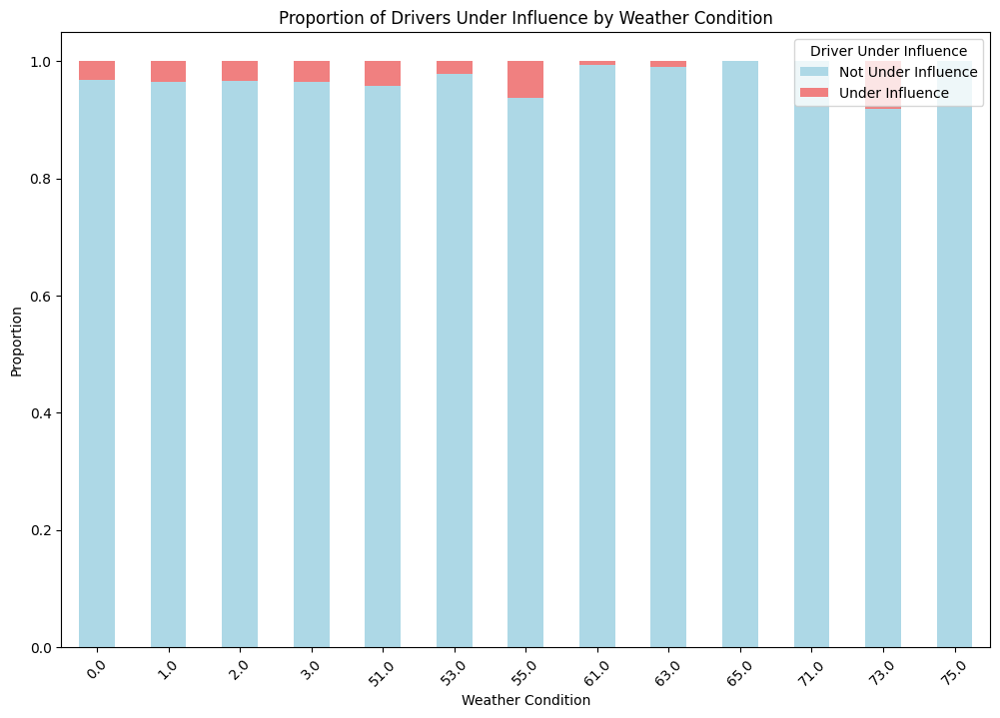

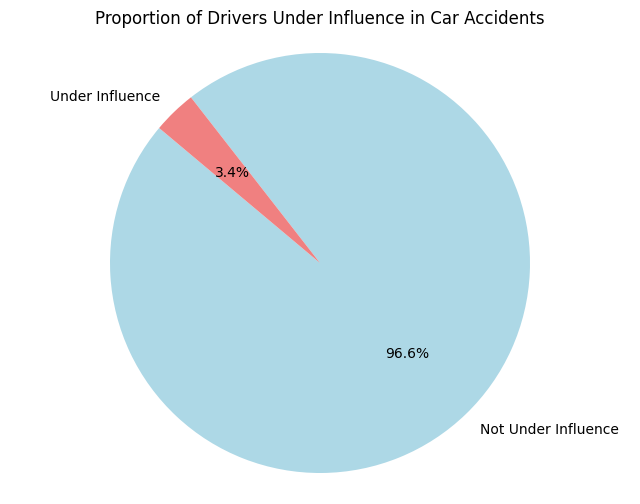

In [4]:
# variable driver_substance_abuse has 3 categories: 0 (No), 1 (Yes), 2 (Unknown)

# adding a column to the dataset indicating whether the driver was under the influence or not

under_influence_modalities = [
    "ALCOHOL PRESENT",
    "ALCOHOL CONTRIBUTED",
    "ILLEGAL DRUG PRESENT",
    "ILLEGAL DRUG CONTRIBUTED",
    "Suspect of Alcohol Use, Not Suspect of Drug Use",
    "Suspect of Alcohol Use, Unknown",
    "Suspect of Alcohol Use, Suspect of Drug Use",
    "COMBINED SUBSTANCE PRESENT",
    "MEDICATION CONTRIBUTED",
    "MEDICATION PRESENT",
]

car_accidents_data["Driver_Under_Influence"] = car_accidents_data["Driver Substance Abuse"].apply(
    lambda x: 1 if x in under_influence_modalities else 0
)

car_accidents_data["Driver_Under_Influence"].value_counts()

import matplotlib.pyplot as plt
# percentage of accident where the driver was under the influence during the night vs day
day_night_influence = pd.crosstab(
    car_accidents_data["day_or_night_code"],
    car_accidents_data["Driver_Under_Influence"],
    rownames=["Day or Night"],
    colnames=["Driver Under Influence"],
    normalize='index'
)

day_night_influence.plot(kind='bar', stacked=True, figsize=(10, 6), color=['lightblue', 'lightcoral'])
plt.title("Proportion of Drivers Under Influence by Day or Night")
plt.ylabel("Proportion")
plt.xticks(ticks=[0, 1], labels=["Day", "Night"], rotation=0)
plt.legend(title="Driver Under Influence", labels=["Not Under Influence", "Under Influence"])
plt.show()


# percentage of accident where the driver was under the influence during different weather conditions
weather_influence = pd.crosstab(
    car_accidents_data["weather_code"],
    car_accidents_data["Driver_Under_Influence"],
    rownames=["Weather Condition"],
    colnames=["Driver Under Influence"],
    normalize='index'
)

weather_influence.plot(kind='bar', stacked=True, figsize=(12, 8), color=['lightblue', 'lightcoral'])
plt.title("Proportion of Drivers Under Influence by Weather Condition")
plt.ylabel("Proportion")
plt.xticks(rotation=45)
plt.legend(title="Driver Under Influence", labels=["Not Under Influence", "Under Influence"])
plt.show()

# Plotting the graphs with the proportion of drivers under influence in Car Accidents
labels = ["Not Under Influence", "Under Influence"]
sizes = car_accidents_data["Driver_Under_Influence"].value_counts().values
colors = ['lightblue', 'lightcoral']
plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title("Proportion of Drivers Under Influence in Car Accidents")
plt.axis('equal')
plt.show()

## Weather and car accidents

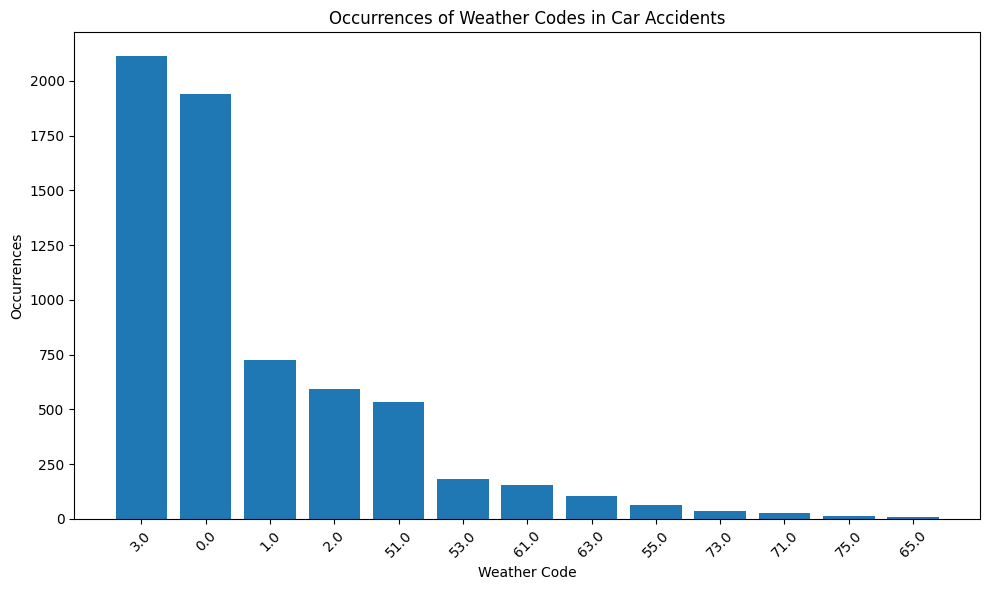

In [5]:
# Plotting the graphs with the proportion of weather_code in Car Accidents
#labels = ["Not Under Influence", "Under Influence"]
# compter les occurrences
counts = car_accidents_data["weather_code"].value_counts()

plt.figure(figsize=(10, 6))
plt.bar(counts.index.astype(str), counts.values)  # aucun style/couleur imposé
plt.xlabel("Weather Code")
plt.ylabel("Occurrences")
plt.title("Occurrences of Weather Codes in Car Accidents")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plotting car accidents on a map

In [ ]:
print(car_accidents_data)

      Unnamed: 0.5  Unnamed: 0.4  Unnamed: 0.3  Unnamed: 0.2  Unnamed: 0.1  \
0                0             0             0             0             0   
1                1             1             1             1             1   
2                2             2             2             2             2   
3                3             3             3             3             3   
4                4             4             4             4             4   
...            ...           ...           ...           ...           ...   
6493          6493          6493          6493          6493          6493   
6494          6494          6494          6494          6494          6494   
6495          6495          6495          6495          6495          6495   
6496          6496          6496          6496          6496          6496   
6497          6497          6497          6497          6497          6497   

      Unnamed: 0 Report Number Local Case Number               

In [14]:
# Extraire la date
car_accidents_data['Date'] = car_accidents_data['Crash Date/Time'].str.split(" ").str[0]

# Convertir l'heure en format 24h
def convert_to_24h(date_time):
    hour = date_time.split(" ")[1].split(":")[0]
    time_of_day = date_time.split(" ")[2]
    time_minutes = date_time.split(" ")[1].split(":")[1]

    if time_of_day == "PM" and hour != "12":
        accident_hour_24h = int(hour) + 12
    elif time_of_day == "AM" and hour == "12":
        accident_hour_24h = 00
    else :
        accident_hour_24h = int(hour)

    if accident_hour_24h < 10:
        accident_hour_24h = "0" + str(accident_hour_24h)

    accident_time_24h = str(accident_hour_24h) + ":" + time_minutes + ":00"

    return accident_time_24h

car_accidents_data['Accident time in 24h format'] = car_accidents_data['Crash Date/Time'].apply(convert_to_24h)

car_accidents_data[['Crash Date/Time', 'Date', 'Accident time in 24h format', 'Latitude', 'Longitude']].head()

,Crash Date/Time,Date,Accident time in 24h format,Latitude,Longitude
0,04/12/2022 07:40:00 AM,04/12/2022,07:40:00,39.084912,-77.076068
1,06/23/2016 10:35:00 AM,06/23/2016,10:35:00,39.013298,-77.045822
2,03/09/2016 07:00:00 AM,03/09/2016,07:00:00,39.026372,-77.204397
3,05/14/2018 06:55:00 AM,05/14/2018,06:55:00,39.176243,-77.118350
4,05/06/2020 03:02:00 PM,05/06/2020,15:02:00,38.992689,-77.161965


In [21]:
import folium

# Centre approximatif de la zone (Maryland / Washington DC selon ton extrait)
center_lat = car_accidents_data["Latitude"].mean()
center_lon = car_accidents_data["Longitude"].mean()

# Création de la carte
m = folium.Map(location=[center_lat, center_lon], zoom_start=11)

# Ajout des points
for _, row in car_accidents_data.iterrows():
    folium.CircleMarker(
        location=[row["Latitude"], row["Longitude"]],
        radius=3,
        fill=True,
        fill_opacity=0.7,
        opacity=0.7
    ).add_to(m)

# Affichage de la carte
m


In [6]:
import pandas as pd
import plotly.express as px

car_accidents_data["Datetime"] = pd.to_datetime(
    car_accidents_data["Date"] + " " + car_accidents_data["Accident time in 24h format"]
)
car_accidents_data = car_accidents_data.sort_values("Datetime")
car_accidents_data["DatetimeStr"] = car_accidents_data["Datetime"].dt.strftime("%Y-%m-%d %H:%M:%S")

# Pour réduire le nombre de frames, on peut arrondir à la minute
car_accidents_data["Minute"] = car_accidents_data["Datetime"].dt.floor('T').astype(str)

fig = px.scatter_mapbox(
    car_accidents_data,
    lat="Latitude",
    lon="Longitude",
    hover_name="DatetimeStr",
    animation_frame="Minute",
    zoom=9,
    height=700,
)

fig.update_layout(
    mapbox_style="open-street-map",
    title="Accidents de voiture dans le temps",
    title_x=0.5
)

# Vitesse de l'animation
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 100  # 100 ms par frame
fig.layout.updatemenus[0].buttons[0].args[1]["transition"]["duration"] = 0

fig.show()

KeyboardInterrupt: 

# Drafts

In [10]:
# we are gonna create an animation in fonction of the time, showing car accidents occuring over time (one car accident remains on the map for 1 second before disappearing)

import time
start_time = time.perf_counter()
n = len(car_accidents_data)

for i in range(0,n):
    print(f"Processing row {i} of {n}")
    latitude = car_accidents_data.iloc[i]['Latitude']
    longitude = car_accidents_data.iloc[i]['Longitude']
    date_time = car_accidents_data.iloc[i]['Crash Date/Time']

    date = date_time.split(" ")[0]
    accident_time = date_time.split(" ")[1] #useless

    hour = date_time.split(" ")[1].split(":")[0]
    time_of_day = date_time.split(" ")[2]
    time_minutes = date_time.split(" ")[1].split(":")[1]

    if time_of_day == "PM" and hour != "12":
        accident_hour_24h = int(hour) + 12
    elif time_of_day == "AM" and hour == "12":
        accident_hour_24h = 00
    else :
        accident_hour_24h = int(hour)

    if accident_hour_24h < 10:
        accident_hour_24h = "0" + str(accident_hour_24h)
    accident_time_24h = str(accident_hour_24h) + ":" + time_minutes + ":00"
    
    car_accidents_data[i, "Date" ] = date
    car_accidents_data[i, "Accident time in 24h format"] = accident_time_24h


    """
    print("Latitude: ", latitude)
    print("Longitude: ", longitude)
    print("Date: ", date)
    print("Accident time in 24h format: ", accident_time_24h)
    """

Processing row 0 of 6498
Processing row 1 of 6498
Processing row 2 of 6498
Processing row 3 of 6498
Processing row 4 of 6498
Processing row 5 of 6498
Processing row 6 of 6498
Processing row 7 of 6498
Processing row 8 of 6498
Processing row 9 of 6498
Processing row 10 of 6498
Processing row 11 of 6498
Processing row 12 of 6498
Processing row 13 of 6498
Processing row 14 of 6498
Processing row 15 of 6498
Processing row 16 of 6498
Processing row 17 of 6498
Processing row 18 of 6498
Processing row 19 of 6498
Processing row 20 of 6498
Processing row 21 of 6498
Processing row 22 of 6498
Processing row 23 of 6498
Processing row 24 of 6498
Processing row 25 of 6498
Processing row 26 of 6498
Processing row 27 of 6498
Processing row 28 of 6498
Processing row 29 of 6498
Processing row 30 of 6498
Processing row 31 of 6498
Processing row 32 of 6498
Processing row 33 of 6498
Processing row 34 of 6498
Processing row 35 of 6498
Processing row 36 of 6498
Processing row 37 of 6498
Processing row 38 of 6

KeyboardInterrupt: 

In [16]:
import pandas as pd
import plotly.express as px
import numpy as np

# Patch pour NumPy 2.0 afin d'éviter l'erreur "np.bool8"
if not hasattr(np, "bool8"):
    np.bool8 = np.bool_

# ----------------------------
# 1) Construction du datetime
# ----------------------------
car_accidents_data["Datetime"] = car_accidents_data.apply(
    lambda row: pd.to_datetime(row["Date"] + " " + row["Accident time in 24h format"]),
    axis=1
)

# Tri des accidents par date/heure
car_accidents_data = car_accidents_data.sort_values("Datetime")

# Ajouter une colonne textuelle pour l'animation
car_accidents_data["DatetimeStr"] = car_accidents_data["Datetime"].dt.strftime("%Y-%m-%d %H:%M:%S")

# ----------------------------
# 2) Graphique animé sur carte
# ----------------------------
fig = px.scatter_mapbox(
    car_accidents_data,
    lat="Latitude",
    lon="Longitude",
    hover_name="DatetimeStr",
    hover_data={"Latitude": True, "Longitude": True},
    animation_frame="DatetimeStr",
    zoom=9,
    height=700,
)

# Style de carte (OpenStreetMap = gratuit)
fig.update_layout(
    mapbox_style="open-street-map",
    title="Animation des accidents de voiture dans le temps",
    title_x=0.5
)

# Taille et vitesse de l'animation
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 200  # 200ms
fig.layout.updatemenus[0].buttons[0].args[1]["transition"]["duration"] = 0

fig.show()


/var/folders/5v/9b211qsj52sgwg1mx65bdc9m0000gn/T/ipykernel_89178/3156100560.py:6: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not hasattr(np, "bool8"):
/var/folders/5v/9b211qsj52sgwg1mx65bdc9m0000gn/T/ipykernel_89178/3156100560.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  car_accidents_data["Datetime"] = car_accidents_data.apply(
/var/folders/5v/9b211qsj52sgwg1mx65bdc9m0000gn/T/ipykernel_89178/3156100560.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  car_accide